<a href="https://colab.research.google.com/github/jamaral68/airbnb_buenos_aires/blob/main/Analisando_os_Dados_do_Airbnb_de_Buenos_Aires.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo"  src="https://raw.githubusercontent.com/jamaral68/jamaral68/main/logo_jamaral_vermelho_estreito.png">


 *by [Jorge Amaral]( https://www.linkedin.com/in/jorge-amaral-78101627/)*

---

# Análise dos Dados do Airbnb - *Buenos Aires*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para tornar essa hospedagem alternativa.

No final de 2018, a Startup fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados do site, para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://drive.google.com/file/d/125YAgSlMd-R-_qoTOmh_q8XCiETjQshy/view?usp=sharing"></center>

**Neste *notebook*, iremos analisar os dados referentes à cidade de Buenos Aires, e ver quais insights podem ser extraídos a partir de dados brutos.Buenos Aires é uma ótima opção de turismo para os brasileiros, principalmente agora com o dólar e o euro muito caros!!!**

## Obtenção dos Dados


In [ ]:
# importar os pacotes necessarios
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
%matplotlib inline

In [ ]:
# importar o arquivo listings.csv para um DataFrame
url = "https://drive.google.com/file/d/1039L4D5CJMDyVvdWa-qkOJceITxtN1ZV/view?usp=sharing"
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df = pd.read_csv(path)


## Análise dos Dados


**Dicionário das variáveis**

* `id` - número de id gerado para identificar o imóvel
* `name` - nome da propriedade anunciada
* `host_id` - número de id do proprietário (anfitrião) da propriedade
* `host_name` - Nome do anfitrião
* `neighbourhood_group` - esta coluna não contém nenhum valor válido
* `neighbourhood` - nome do bairro
* `latitude` - coordenada da latitude da propriedade
* `longitude` - coordenada da longitude da propriedade
* `room_type` - informa o tipo de quarto que é oferecido
* `price` - preço para alugar o imóvel
* `minimum_nights` - quantidade mínima de noites para reservar
* `number_of_reviews` - número de reviews que a propriedade possui
* `last_review` - data do último review
* `reviews_per_month` - quantidade de reviews por mês
* `calculated_host_listings_count` - quantidade de imóveis do mesmo anfitrião
* `availability_365` - número de dias de disponibilidade dentro de 365 dias
* `number_of_reviews_ltm` - número de reviews nos últimos 12 meses que a propriedade possui
* `license` - esta coluna não contém nenhum valor válido

Antes de iniciar qualquer análise, vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [ ]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6283,Casa Al Sur,13310,Pamela,NaN,Balvanera,-34.60523,-58.41042,Entire home/apt,4810,3,1,2011-01-31,0.01,1,365,0,NaN
1,11508,Amazing Luxurious Apt-Palermo Soho,42762,Candela,NaN,Palermo,-34.58184,-58.42415,Entire home/apt,6254,2,27,2021-04-03,0.34,1,76,1,NaN
2,12463,Room in Recoleta - awesome location,48799,Matt,NaN,Recoleta,-34.59777,-58.39664,Private room,2597,1,20,2016-02-12,0.17,1,365,0,NaN
3,13095,Standard Room at Palermo Viejo B&B w pvt Bath,50994,Ariel,NaN,Palermo,-34.59348,-58.42949,Private room,2722,1,1,2018-12-18,0.03,7,365,0,NaN
4,13096,Standard Room in Palermo Viejo B&B,50994,Ariel,NaN,Palermo,-34.59348,-58.42949,Private room,2722,1,0,NaN,NaN,7,365,0,NaN


### **Q1. Quantos atributos (variáveis) e quantas entradas o nosso conjunto de dados possui? Quais os tipos das variáveis?**

In [ ]:
# identificar o volume de dados do DataFrame

print("Entradas:\t {}".format(df.shape[0]))
print("Variáveis:\t {}\n".format(df.shape[1]))

# verificar as 5 primeiras entradas do dataset
display(df.dtypes)
# verificar as 5 primeiras entradas do dataset


Entradas:	 18635
Variáveis:	 18



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

In [ ]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)

neighbourhood_group               1.000000
license                           0.996941
reviews_per_month                 0.323048
last_review                       0.323048
host_name                         0.001395
name                              0.000268
longitude                         0.000000
host_id                           0.000000
neighbourhood                     0.000000
latitude                          0.000000
room_type                         0.000000
number_of_reviews_ltm             0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
calculated_host_listings_count    0.000000
availability_365                  0.000000
id                                0.000000
dtype: float64

A qualidade de um *dataset* está diretamente relacionada à quantidade de valores ausentes. É importante entender logo no início se esses valores nulos são significativos comparados ao total de entradas.

* É possível ver que a coluna `neighbourhood_group` possui 100% dos seus valores faltantes. 
* As variáveis `reviews_per_month` e `last_review` possuem valores nulos em 32,3% dos seus valores faltantes.
* A variável `host_name` tem aproximadamente 0,14% dos valores nulos.
* A variável `name` tem aproximadamente 0,03% dos valores nulos.

Portanto, vamos **eliminar** a coluna `neighbourhood_group` do dataset

### **Q3. Qual o tipo de distribuição das variáveis?** 

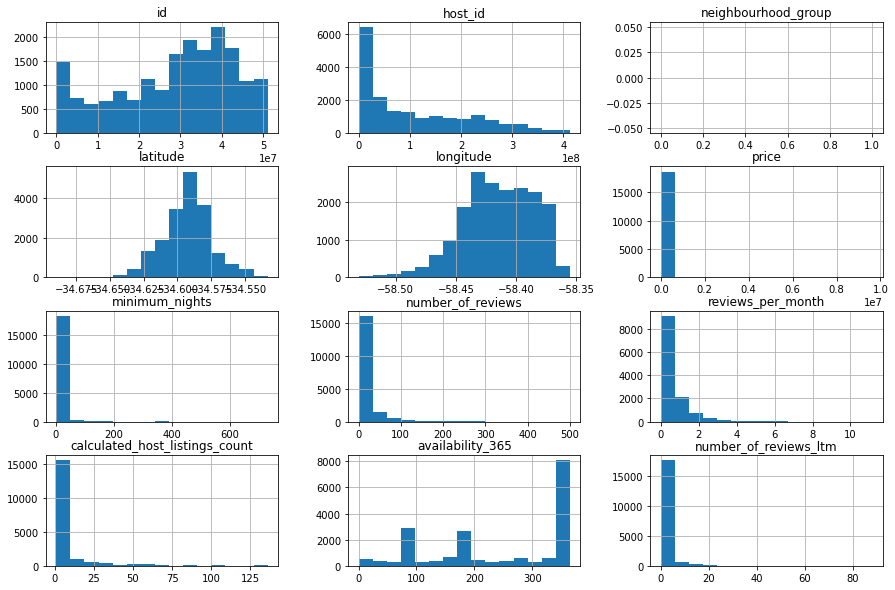

In [ ]:
# plotar o histograma das variáveis numéricas
df.hist(bins=15, figsize=(15,10));

### **Q4. Qual a média dos preços de aluguel?**

In [ ]:
# ver a média da coluna `price``
print("O valor médio dos preços praticados: %8.2f" % (df['price'].mean()))
print("O valor da mediana dos preços praticados: %8.2f" % (df['price'].median()))
 



O valor médio dos preços praticados:  5933.88
O valor da mediana dos preços praticados:  2790.00


In [ ]:
# ver quantidade de valores acima de 15000 para price
preco_limite = 15000
print("\nprice: valores acima de {} pesos".format(preco_limite))
print("{} entradas".format(len(df[df.price > preco_limite])))
print("{:.4f}%".format((len(df[df.price > preco_limite]) / df.shape[0])*100))



price: valores acima de 15000 pesos
512 entradas
2.7475%


A diferença entre a média e a mediana, nos fazem suspeitar da presença de valores extremos de preço neste dataset. Podemos observar que a variável `price`(preço) tem a grande parte dos seus valores (97,25%) concentrada no intervalo entre 0 e 15000 pesos. Quando este notebook foi feito( outubro de 2021) , 1000 pesos argentinos valiam cerca de 56 reais, portanto, 15000 pesos representam um valor de diária de 840 reais. Vamos **limitar** o valor máximo a ser pago a **15000 pesos** .


In [ ]:

# ver quantidade de valores acima de 30 dias para minimum_nights
min_nights = 30
print("minimum_nights: valores acima de {:d}:".format(min_nights))
print("{} entradas".format(len(df[df.minimum_nights > min_nights])))
print("{:.4f}%".format((len(df[df.minimum_nights > min_nights]) / df.shape[0])*100))

minimum_nights: valores acima de 30:
381 entradas
2.0445%


Seguindo, um raciocínio semelhante, vamos limitar o número mínimo de noites a 30, o que representa um mês de férias, pois observamos que apenas 2% dos imóveis tem mínimo de noite maior que 30. Portanto vamos **limitar** o valor mínimo de noites a **30 noites**.

In [ ]:
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.price > preco_limite].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.minimum_nights > min_nights].index, axis=0, inplace=True)

# remover `neighbourhood_group`, pois está vazio
df_clean.drop('neighbourhood_group', axis=1, inplace=True)


In [ ]:
df_clean.shape

(17758, 17)

### **Q4. Qual a correlação existente entre as variáveis**

In [ ]:
# criar uma matriz de correlação

variaveis_numericas = [var for var in df_clean.columns if df_clean[var].dtypes != 'O']

corr = df_clean[variaveis_numericas].corr()


# mostrar a matriz de correlação
display(corr)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
id,1.000000,0.484078,0.013730,-0.038047,-0.112140,-0.050114,-0.363972,0.016327,0.058661,-0.150404,0.059226
host_id,0.484078,1.000000,-0.088772,-0.000505,-0.094492,-0.086786,-0.183653,-0.000528,-0.185489,-0.093951,-0.006654
latitude,0.013730,-0.088772,1.000000,-0.537222,0.114527,0.053342,0.026012,0.035854,0.049144,-0.020064,0.064919
longitude,-0.038047,-0.000505,-0.537222,1.000000,0.039680,-0.026213,0.044264,0.027038,0.036650,0.025128,-0.031358
price,-0.112140,-0.094492,0.114527,0.039680,1.000000,-0.036238,-0.056325,-0.102046,0.140904,0.053870,-0.091619
minimum_nights,-0.050114,-0.086786,0.053342,-0.026213,-0.036238,1.000000,-0.071689,-0.101776,0.071909,0.021907,-0.082975
number_of_reviews,-0.363972,-0.183653,0.026012,0.044264,-0.056325,-0.071689,1.000000,0.759786,-0.061262,-0.037558,0.294318
reviews_per_month,0.016327,-0.000528,0.035854,0.027038,-0.102046,-0.101776,0.759786,1.000000,-0.016368,-0.121243,0.553121
calculated_host_listings_count,0.058661,-0.185489,0.049144,0.036650,0.140904,0.071909,-0.061262,-0.016368,1.000000,0.060777,0.056514
availability_365,-0.150404,-0.093951,-0.020064,0.025128,0.053870,0.021907,-0.037558,-0.121243,0.060777,1.000000,-0.083071


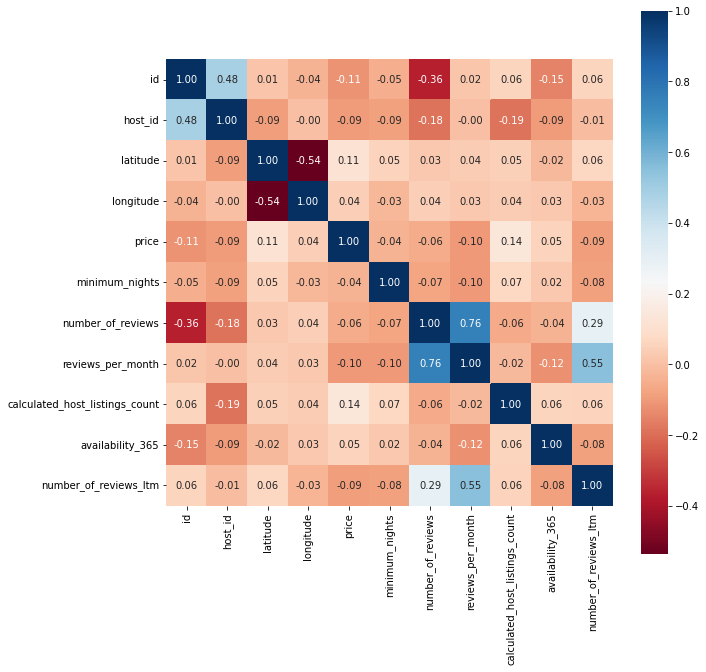

In [ ]:
# plotar um heatmap a partir das correlações
fig, ax = plt.subplots(figsize=(10,10))    
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True, ax=ax);

As maiores correlações são entre number_of_reviews e reviews_per_month (0.76) e number_of_reviews_ltm e reviews_per_month(0.55), o que já era esperado. As outras correlações entre as variáveis são baixas.

### **Q5. Qual o tipo de imóvel mais alugado no Airbnb?**

In [ ]:
# mostrar a quantidade de cada tipo de imóvel disponível
df_clean.room_type.value_counts()

Entire home/apt    13926
Private room        3301
Shared room          376
Hotel room           155
Name: room_type, dtype: int64

In [ ]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df.room_type.value_counts() / df.shape[0]

Entire home/apt    0.786638
Private room       0.182989
Shared room        0.020821
Hotel room         0.009552
Name: room_type, dtype: float64

O tipo de imóvel mais alugado é a casa/apartamento inteiro e que corresponde a  quase 79% do total de imóveis oferecidos.

### **Q6. Qual a localidade mais cara do dataset?**



In [ ]:
# ver preços por bairros, na média
pd.options.display.float_format = "{:,.2f}".format
preco_bairro= pd.DataFrame(columns=['numero_imoveis','preco_medio'])
preco_bairro['numero_imoveis']=df_clean['neighbourhood'].value_counts()
preco_bairro['preco_medio']=df_clean.groupby(['neighbourhood']).price.mean()
preco_bairro.sort_values('preco_medio',ascending=False)

,numero_imoveis,preco_medio
Puerto Madero,169,"7,851.24"
Villa Soldati,3,"5,593.67"
Villa Real,7,"4,271.43"
Palermo,5510,"3,973.36"
Floresta,23,"3,839.65"
Recoleta,2979,"3,798.01"
Villa Devoto,51,"3,755.33"
Retiro,980,"3,609.92"
Nuñez,328,"3,544.93"
Belgrano,765,"3,431.20"


In [ ]:
numero_imoveis = preco_bairro.sort_values('numero_imoveis', ascending=False)
numero_imoveis['porcentagem']=numero_imoveis['numero_imoveis']/numero_imoveis['numero_imoveis'].sum()
numero_imoveis['porcentagem']

Palermo             0.31
Recoleta            0.17
San Nicolas         0.07
Retiro              0.06
Balvanera           0.05
Belgrano            0.04
Monserrat           0.04
Almagro             0.04
Villa Crespo        0.03
San Telmo           0.03
Colegiales          0.02
Nuñez               0.02
Caballito           0.02
Chacarita           0.01
Constitucion        0.01
Villa Urquiza       0.01
Puerto Madero       0.01
Barracas            0.01
San Cristobal       0.01
Saavedra            0.01
Boca                0.01
Boedo               0.01
Flores              0.00
Coghlan             0.00
Villa Devoto        0.00
Parque Patricios    0.00
Villa Ortuzar       0.00
Parque Chacabuco    0.00
Villa Del Parque    0.00
Villa Pueyrredon    0.00
Villa Santa Rita    0.00
Floresta            0.00
Paternal            0.00
Villa Gral. Mitre   0.00
Parque Chas         0.00
Agronomia           0.00
Velez Sarsfield     0.00
Monte Castro        0.00
Liniers             0.00
Nueva Pompeya       0.00


A localidade mais cara é a de Porto Madero. Ele é um importante ponto turístico e conta com várias lojas e restaurantes. Além disso, fica próximo de outros pontos turísticos como a Casa Rosada. Também existe uma grande oferta de imóveis para alugar em Palermo (31%) e Recoleta(17%) que também contam com diversos atrativos para os turistas.

#### Vamos mostrar um mapa com alguns pontos turisticos destacados e os imóveis disponíveis para alugar de acordo com sua faixa de preço.

In [ ]:
#Criando um dataframe com os pontos turísticos
dict_pontos_turisticos = {
    'name' : ['Casa Rosada', 'Museu de Arte Latino-Americana', 'Centro Cultural Borges', 'Origen Cafe', 'Centro Cultural Recoleta', 'El Boliche de Roberto'],
    'latitude' : [-34.607468158962845, -34.57530659990212, -34.599270159019035,-34.62039211558699, -34.58584538798823, -34.605840440306565],
    'longitude' : [-58.37055774658594, -58.40071158237602, -58.37422048411812, -58.37387716136348,-58.39147245253889, -58.4184232887849  ],
}
df_pontos_turisticos = pd.DataFrame(dict_pontos_turisticos)
min_price = df_clean.price.min()
q1_price = np.percentile(df_clean.price, 25)
q2_price = np.percentile(df_clean.price, 50)
q3_price = np.percentile(df_clean.price, 75)
max_price = df_clean.price.max() 
from branca import colormap as cm
colormap = cm.StepColormap(colors=['green','yellow','orange','red'] ,
                           index=[min_price,q1_price,q2_price,q3_price,max_price], 
                           vmin= min_price,
                           vmax=max_price)



In [ ]:
# plotar os pontos turiasticos e os imóveis pela latitude-longitude
buenos_aires = folium.Map(
    location=[-34.60761, -58.44463],zoom_start=12    # Coordenadas retiradas do Google Maps
)
for index, row in df_pontos_turisticos.iterrows():
    folium.Marker([row['latitude'], row['longitude']],popup=row['name']).add_to(buenos_aires)

for index, row in df_clean.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],radius=1, color= colormap(row['price'])).add_to(buenos_aires)
display(buenos_aires)

O Mapa mostra alguns pontos turísticos de Buenos Aires  juntamente com os imóveis, que estão coloridos de acordo seu preço. A escala possui as cores verde, amarelo, laranja e vermelho.O verde representa os imóveis mais baratos e os vermelhos representam os mais caros.

### **Q7. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [ ]:
# ver a média da coluna `minimum_nights``
df_clean.minimum_nights.mean()

4.779198107895033

In [ ]:
A média do mínimo de noites para aluguel é de aproximadamente 5 noites.

## Conclusões


Foi feita apenas uma análise superficial na base de dados do Airbnb, porém já se percebeu que existem *outliers* em algumas das variáveis. 

Também se notou que boa parte dos imóveis ofertados estão localizados nos bairros de Palermo (31%) e Recoleta (17%). O custo médio da diária é de 5933,88 pesos, o que dá aproximadamente 106 reais por noite e quem aluga passa em média 5 noites na cidade.

Por fim, lembra-se que este *dataset* é uma versão resumida, ideal apenas para uma abordagem inicial. Recomenda-se que seja usado, em uma próxima análise exploratória, o conjunto de dados completos, com 106 atributos disponíveis.